# Creating ML Congergence Animation for IrOx Systems
---

# Import Modules

In [1]:
import os
import sys

import json
import time

import copy
import pickle
import pandas as pd

import plotly.graph_objects as go
import chart_studio.plotly as py
from chart_studio.grid_objs import Grid, Column

# #############################################################################
from plotting.my_plotly import my_plotly_plot

sys.path.insert(0, "../04_final_ml_plots")
from layout import get_layout

from methods import get_trace_j

sys.path.insert(0, os.path.join(os.environ["PROJ_irox"], "data"))
from proj_data_irox import (
    bulk_dft_data_path,
    ids_to_discard__too_many_atoms_path,
    unique_ids_path,
    df_dij_path)

from anim_methods import (
    get_sliders_init_dict,
    get_slider_step_i,
    get_layout)

# Script Inputs

In [2]:
stoich_i = "AB2"
# stoich_i = "AB3"


custom_name = "regular"

# duration_long = 1000 * 5
# duration_short = 800 * 3

# duration_long = 1000 * 1
# duration_short = 800 * 1

duration_long = 1000 * 1
duration_short = 800 * 1

d_thresh = 0.02

In [3]:
indices_to_drop_final = [
 'c3mp6jmgzq',
 'cfcivdxrc2',
 'bs8obtmo7t',
 'vsvsms92ng',
 '9qzl9t7l84',
 'xjbj6fbfn1',
 'vt658pbemi',
 '9inyzl728q',
 'cqbax4mr9q',
 'md7oztcizu',
 'npcdcwz1ny',
 'nazu9q9l9h',
 'cubdn2z4cy',
 'xu94m1zf7f',
 'b3maz37tbt',
 'b46enqnq8e',
 'vucd739a75',
 'cica8ozani',
 'mwc4xhbg8y',
 '6r716sxr9t',
 'xgmkzuxf8g',
 '8l9r8fmtxe',
 'vunhmsbrml',
 'byna7ivi7k',
 '91746y6g6i',
 '727lmkmq74',
 'm29j648g6i',
 'bgvr62z2ce',
 'vyngx56i9r',
 '9wvd757p8j',
 '8aza84xlvs',
 '95c29e9f6h',
 'xhbabrx4zq',
 'vsxlxlblxh',
 'm16tvk8h7g',
 '6w7ezj7gml',
 '6avov5cy64',
 'v2xdzuv2z3',
 'xtxa7qzenu',
 '8lmuzfxs7i',
 'mt74vibqnu',
 'zgntxjxrvj',
 'xonhb1cgnq',
 'zwmivrzazu',
 'nf65zg7qn5',
 '9yz2mt8hbh',
 '8p937183bh',
 '8rze7acixu',
 'vp7fvs6q81',
 'bszu7yzjct',
 'vgxp94xi9i',
 'mibh7jcez4',
 'm1be7p8ong']

In [4]:
layout_anim = get_layout(
    duration_long=duration_long,
    duration_short=duration_short)

sliders_dict = get_sliders_init_dict(duration_short)

# Read AL Data

In [5]:
import pickle; import os
path_i = os.path.join(
    os.environ["PROJ_irox"],
    "workflow/ml_modelling/processing_bulk_dft/parse_my_bulk_dft/out_data",
    "ignore_ids.pickle")

with open(path_i, "rb") as fle:
    ignore_ids_dict = pickle.load(fle)
ignore_ids_i = ignore_ids_dict[stoich_i]

In [6]:
df_ids = pd.read_csv(unique_ids_path)

df_ids = df_ids[df_ids["stoich"] == stoich_i]

ignore_ids_tmp = []
for ignore_id_j in ignore_ids_i:

    df_ids_j = df_ids[df_ids["id"] == int(ignore_id_j)]
    assert df_ids_j.shape[0] == 1, "ISDFIdisjf"
    row_j = df_ids_j.iloc[0]

    unique_id_j = row_j["unique_ids"]
    ignore_ids_tmp.append(unique_id_j)
    
# ignore_ids_tmp

In [7]:
# assert False

In [8]:
# #############################################################################
al_output_data_path = os.path.join(
    os.environ["PROJ_irox"],
    "workflow/ml_modelling", "00_ml_workflow/190611_new_workflow",
    "02_gaus_proc/out_data",
    "data_dict_" + stoich_i + "_" + custom_name + ".pickle")

    # "random_data_dict_" + stoich_i + ".pickle")
    # "data_dict_" + stoich_i + ".pickle")

with open(al_output_data_path, "rb") as fle:
    al_data_dict = pickle.load(fle)


# #############################################################################
with open(bulk_dft_data_path, "rb") as fle:
    df_bulk_dft = pickle.load(fle)
    df_bulk_dft_orig = copy.deepcopy(df_bulk_dft)

    sources = ['raul', 'raul_oer']
    df_bulk_dft = df_bulk_dft[df_bulk_dft["source"].isin(sources)]

In [9]:
df_dij_path_tmp = df_dij_path[0:-18] + "df_d_ij_all_temp.pickle"
# with open(df_dij_path, "rb") as fle:
with open(df_dij_path_tmp, "rb") as fle:
    df_dij_dft = pickle.load(fle)
    print("df_dij_dft.shape:", df_dij_dft.shape)

df_dij_dft.shape: (1662, 1662)


In [10]:
# #############################################################################
path_i = os.path.join(
    os.environ["PROJ_irox"],
    "workflow/ml_modelling/ccf_similarity_analysis/out_data",
    "all_ids_to_elim_1.pickle")
with open(path_i, "rb") as fle:
    ids_to_drop__duplicates = pickle.load(fle)
    ids_to_drop__duplicates = ids_to_drop__duplicates[stoich_i]


# #############################################################################
path_i = os.path.join(
    os.environ["PROJ_irox"],
    "workflow/ml_modelling/visualizing_data/out_data",
    "outlier_features.json")
with open(path_i, 'r') as f:
    ids_to_drop__outliers = json.load(f)


# #############################################################################
with open(ids_to_discard__too_many_atoms_path, "rb") as fle:
    ids_to_drop__too_many_atoms = pickle.load(fle)


# #############################################################################
ids_to_drop = [] + \
    ids_to_drop__duplicates

#     ids_to_drop__outliers + \
#     ids_to_drop__too_many_atoms

In [11]:
al_data_dict[0]["model"]

"prediction",
"uncertainty",
"uncertainty_with_reg",
"uncertainty_with_reg_unstandardized",
"tmp",

('tmp',)

# Frames

In [12]:
last_key = list(al_data_dict.keys())[-1]

data_dict_last = al_data_dict[last_key]
model_last = data_dict_last["model"]

model_i = model_last
indices_to_check = model_i[model_i["computed"] == True].index.tolist()


index_to_eliminate = []
for j_cnt, row_j in df_dij_dft.loc[indices_to_check, indices_to_check].iterrows():
    cols_below_thresh = row_j[row_j < d_thresh]
    if cols_below_thresh.shape[0] > 1:
        df_i = df_bulk_dft.loc[cols_below_thresh.index]
        index_to_eliminate += df_i.iloc[1:].index.tolist()
index_to_eliminate = list(set(index_to_eliminate))
indices_to_drop_all = index_to_eliminate

# indices_to_drop_all

In [13]:
df_bulk_dft_tmp = copy.deepcopy(df_bulk_dft)
df = df_bulk_dft_tmp
df_bulk_dft_tmp = df[
    (df["stoich"] == stoich_i) & \
    (df["source"] == "raul") & \
    [True for i in range(len(df))]]

df_bulk_dft_tmp = df_bulk_dft_tmp.sort_values("energy_pa")
df_bulk_dft_tmp = df_bulk_dft_tmp.drop(indices_to_drop_all, errors="ignore")


top_10_perc_ids = df_bulk_dft_tmp.iloc[0:int(0.1 * df_bulk_dft_tmp.shape[0])].index.tolist()

In [14]:
cols_below_thresh.index

Index(['zynemucrv1'], dtype='object', name='index')

In [15]:
df_bulk_dft_orig.loc["vlbdnoxlnh"]

# df_bulk_dft.loc["vlbdnoxlnh"]

,atoms,energy_pa,form_e_chris,id,id_old,path,source,stoich,energy,num_atoms
id_unique,,,,,,,,,,
vlbdnoxlnh,"(Atom('O', [-0.41547, 0.11409, 2.07042], index...",-6.461793,NaN,NaN,88,/global/cscratch1/sd/flores12/IrOx_Project_tem...,raul,AB3,-51.694342,8
vlbdnoxlnh,"(Atom('O', [-0.51406, 6.07664, 2.82477], index...",-6.131352,NaN,NaN,88,/mnt/f/GDrive/norskov_research_storage/00_proj...,chris,AB3,-49.050813,8


In [16]:
indices_to_drop = []
frames = []; data = []
for i_cnt, (key, val) in enumerate(al_data_dict.items()):

    print("key:", key)
    data_dict_i = al_data_dict[key]

    # #########################################################################
    columns_list = data_dict_i["model"].columns.tolist()

    col_list_i = []
    for col_j in columns_list: col_list_i.append(col_j + "_" + str(i_cnt))

    # #########################################################################
    model_i = data_dict_i["model"]


    indices_to_check = model_i[model_i["computed"] == True].index.tolist()


    index_to_eliminate = []
    for j_cnt, row_j in df_dij_dft.loc[indices_to_check, indices_to_check].iterrows():
        cols_below_thresh = row_j[row_j < d_thresh]
        if cols_below_thresh.shape[0] > 1:
            df_i = df_bulk_dft.loc[cols_below_thresh.index]
            index_to_eliminate += df_i.iloc[1:].index.tolist()
    index_to_eliminate = list(set(index_to_eliminate))
    indices_to_drop = index_to_eliminate

key: 0
key: 1
key: 2
key: 3
key: 4
key: 5
key: 6
key: 7
key: 8
key: 9
key: 10
key: 11
key: 12
key: 13
key: 14
key: 15
key: 16
key: 17
key: 18
key: 19
key: 20
key: 21
key: 22
key: 23
key: 24
key: 25
key: 26
key: 27
key: 28
key: 29
key: 30
key: 31
key: 32
key: 33
key: 34
key: 35
key: 36
key: 37
key: 38
key: 39
key: 40
key: 41
key: 42


In [17]:
data_dict_i.keys()
data_dict_i["aquisition_data"]

num_dft_calcs = model_i[model_i["computed"] == True].shape[0]

In [18]:
%%capture

data_list = []

indices_to_drop = []
frames = []; data = []
for i_cnt, (key, val) in enumerate(al_data_dict.items()):

    data_dict_j = {}

#     if i_cnt == 5:
#         break

    print("key:", key)
    data_dict_i = al_data_dict[key]

    # #########################################################################
    columns_list = data_dict_i["model"].columns.tolist()

    col_list_i = []
    for col_j in columns_list: col_list_i.append(col_j + "_" + str(i_cnt))

    # #########################################################################
    model_i = data_dict_i["model"]

    # Drop systems that I had difficulty converging (~200)
    model_i = model_i.drop(ignore_ids_tmp, axis=0, errors="ignore")

    indices_to_check = model_i[model_i["computed"] == True].index.tolist()


    index_to_eliminate = []
    for j_cnt, row_j in df_dij_dft.loc[indices_to_check, indices_to_check].iterrows():
        cols_below_thresh = row_j[row_j < d_thresh]
        if cols_below_thresh.shape[0] > 1:
            df_i = df_bulk_dft.loc[cols_below_thresh.index]
            index_to_eliminate += df_i.iloc[1:].index.tolist()
            print(row_j.name)
            print(index_to_eliminate)
            print("")
    index_to_eliminate = list(set(index_to_eliminate))
    indices_to_drop = index_to_eliminate


    # print(indices_to_drop)
    # Drop random rows at every loop
    # indices_to_drop_i = model_i.sample(n=16).index.unique().tolist()
    # indices_to_drop.extend(indices_to_drop_i)
    # model_i = model_i.drop(indices_to_drop)
    # print("model_i.shape:", model_i.shape)

#     if key > 0:
#         data_dict_im1 = al_data_dict[key - 1]

#         aquis_data_dict_i = data_dict_i["aquisition_data"]
#         new_aquis_ids = aquis_data_dict_i["new_ids_to_compute"]
#         indices_to_drop_i = [i for i in new_aquis_ids if i in ids_to_drop]
#         indices_to_drop.extend(indices_to_drop_i)
#     else:
#         tmp = 42

    # #########################################################################
    model_i["TEMP_redundant"] = [True if i in indices_to_drop else False for i in model_i.index]
    model_i["TEMP_redundant_global"] = [True if i in indices_to_drop_final else False for i in model_i.index]

    # original_index_order = model_i.index.tolist()

    prediction_key="prediction_unstandardized"
    uncertainty_key="uncertainty_unstandardized"

    def method(row_i):
        computed = row_i["computed"]
        actually_computed = row_i["actually_computed"]
        dft_energy = row_i["energy_pa"]
        predicted_energy = row_i[prediction_key]
        predicted_uncert = row_i[uncertainty_key]

        # #####################################################################
        new_column_values_dict = {
            "out_energy": None,
            "out_uncert": None}

        # #####################################################################
        if computed and actually_computed:
            new_column_values_dict["Y_main"] = dft_energy
            new_column_values_dict["Y_uncer"] = 0.
        else:
            new_column_values_dict["Y_main"] = predicted_energy
            new_column_values_dict["Y_uncer"] = predicted_uncert

        # #####################################################################
        for key, value in new_column_values_dict.items():
            row_i[key] = value
        return(row_i)

    model_i = model_i.apply(method, axis=1)
    model_i = model_i.sort_values("Y_main")

    model_i_tmp = model_i[model_i["TEMP_redundant"] == False]
    # model_i_tmp["x_axis_ind_new"] = [i for i in range(model_i_tmp.shape[0])]
    model_i_tmp["x_axis_ind"] = [i for i in range(model_i_tmp.shape[0])]

    model_i = pd.concat([
        model_i.drop("x_axis_ind", axis=1),
        model_i_tmp["x_axis_ind"] 
        ],
        axis=1, sort=True,
        )
    model_i["x_axis_ind"] = model_i["x_axis_ind"].fillna("-60")

    al_data_dict[key]["model_processed"] = model_i
    # #########################################################################

    computed_ids = model_i[model_i["computed"] == True].index.tolist()
    top_systems_computed = [i for i in computed_ids if i in top_10_perc_ids]
    num_top_systems_computed = len(top_systems_computed)
    print("Percent of systems computed:", 100 * len(computed_ids) / model_i.shape[0])
    print("Percent of top 10% of systems found:",
        100 * num_top_systems_computed / len(top_10_perc_ids))

    data_dict_j["num_computed"] = len(computed_ids)
    data_dict_j["num_top_systems_computed"] = num_top_systems_computed
    










    traces_i = get_trace_j(
        model_i, df_bulk_dft=df_bulk_dft,
        prediction_key="prediction_unstandardized",
        uncertainty_key="uncertainty_unstandardized",
        plot_dft_instead_of_pred=True,
        trace_all_dft=True, trace_horiz_lines=True)

    # traces_i = list(data_dict_i["fig"].data)



    data_list.append(data_dict_j)



    if i_cnt == 0: data.extend(traces_i)

    data_i = []; data_i.extend(traces_i)

    frame_i = go.Frame(data=data_i, name=str(i_cnt))
    frames.append(frame_i)
    

    slider_step_i = get_slider_step_i(i_cnt, duration_short)
    sliders_dict['steps'].append(slider_step_i)

In [19]:
al_output_data_path = os.path.join(                                           
    os.environ["PROJ_irox"],                                                                                                       
    "workflow/ml_modelling", "00_ml_workflow/190611_new_workflow",            
    "02_gaus_proc/out_data")                                                  
filename_i = "data_dict_" + stoich_i + "_" + custom_name + "_processed.pickle"
# Pickling data ###############################################################
import os; import pickle                                                      
directory = "out_data"                                                        
if not os.path.exists(directory): os.makedirs(directory)                      
with open(os.path.join(al_output_data_path, filename_i), "wb") as fle:        
    pickle.dump(al_data_dict, fle)                                            
# #############################################################################

In [20]:
# model_i["TEMP_redundant_global"] = [True if i in indices_to_drop_final else False for i in model_i.index]

# model_i

In [21]:
model_i[model_i["energy_pa"].isna()].shape

print(model_i.shape)
model_i = model_i.drop(ignore_ids_tmp, axis=0, errors="ignore")
# print(tmp.shape)

# model_i.drop?
# ignore_ids_i

(500, 18)


In [22]:
# ignore_ids_tmp[0] in model_i.index

# model_i.index

df_dij_dft.loc["bpvynr7p9w", "zr9ic2zaz5"]

In [23]:
# row_j.name

# print(index_to_eliminate)

# row_j

In [24]:
len(top_10_perc_ids)

# traces_i

36

In [25]:
# data_list
# data_dict_j

df_discovery_rate = pd.DataFrame(data_list)

df_discovery_rate.to_csv("out_data/df_discovery" + "_" + custom_name + ".csv")
# df_discovery_rate.to_csv("out_data/df_discovery_AL_aquis.csv")

In [26]:
model_i[model_i["TEMP_redundant"] == False].shape

model_i.shape

(500, 18)

out_plot/al_anim_AB2_regular.html


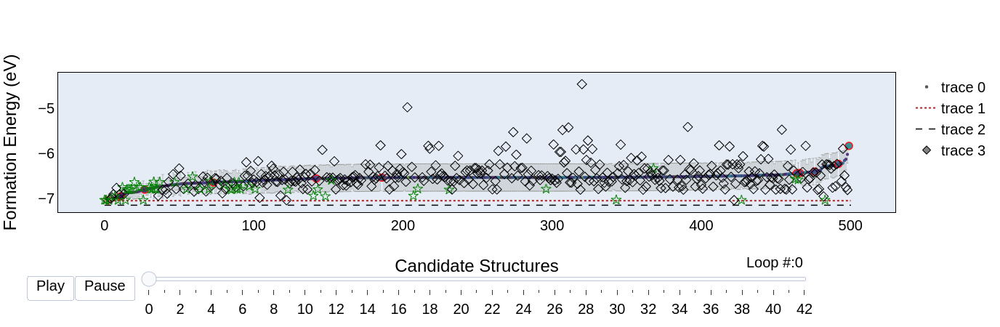

In [27]:
layout_anim["showlegend"] = True

fig = go.Figure(
    data=data,
    layout=layout_anim,
    frames=frames)
fig['layout']['sliders'] = [sliders_dict]

from plotly import io as pyio

file_path_i = os.path.join(
    "out_plot", "al_anim_" + stoich_i + "_" + custom_name + ".html")
print(file_path_i)
pyio.write_html(
    fig,
    file_path_i)

fig